# **VO FINAL PROJECT**

## Exercise 1 - Object recognition and detection in DL

**Group**: Sergi Guimerà Roig, Huilin Ni \
**Deadline**: 09/01/2024


Si ejecutamos des del colab necesitamos mountear el drive y unzip de la carpeta

In [1]:
# from google.colab import drive
# drive.mount('/content/drive/')

In [2]:
# !unzip -q "/content/drive/MyDrive/Q5/VO/VO_Lab/Final_Project/EX1/animals_dataset_bbs.zip"

Importamos los packages con los que trabajamos

In [3]:
# packages
from typing import Any, Callable, List, Optional, Tuple, Union

import torch
# import torch.nn.functional as F
# import torchvision
# from torch import nn
import matplotlib.pyplot as plt
import numpy as np

Necesitamos una buena gráfica para entrenar modelos tan grandes (las T4 del colab con 16 GB o en local una 4060 con 8 GB (+ 4GB compartidos de RAM))

In [4]:
# to train on gpu if selected.
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [5]:
# check device is some GPU/TPU
device

device(type='cuda')

In [6]:
import os
import pandas as pd
# from torchvision.io import read_image
from PIL import Image
import torchvision
from sklearn.preprocessing import LabelEncoder

Queremos trabajar con PyTorch, los modelos que podemos escoger son los siguientes

In [7]:
torchvision.models.list_models(torchvision.models.detection)

['fasterrcnn_mobilenet_v3_large_320_fpn',
 'fasterrcnn_mobilenet_v3_large_fpn',
 'fasterrcnn_resnet50_fpn',
 'fasterrcnn_resnet50_fpn_v2',
 'fcos_resnet50_fpn',
 'keypointrcnn_resnet50_fpn',
 'maskrcnn_resnet50_fpn',
 'maskrcnn_resnet50_fpn_v2',
 'retinanet_resnet50_fpn',
 'retinanet_resnet50_fpn_v2',
 'ssd300_vgg16',
 'ssdlite320_mobilenet_v3_large']

Usaremos una FASTER RCNN, las resnet son muy grandes, así que usamos "fasterrcnn_mobilenet_v3_large_fpn" o la versión de menos resolución 'fasterrcnn_mobilenet_v3_large_320_fpn' ya que como están pensadas para dispositivos mobiles son más pequeñas y por lo tanto ocupan menos en gráfica

Necesitamos leer el dataset, para esto hacemos un dataset personalizado de torch

In [8]:
from torchvision.transforms import functional as F, InterpolationMode

In [9]:
class ScaleJitter(torch.nn.Module):
    """Randomly resizes the image and its bounding boxes  within the specified scale range.
    The class implements the Scale Jitter augmentation as described in the paper
    "Simple Copy-Paste is a Strong Data Augmentation Method for Instance Segmentation" <https://arxiv.org/abs/2012.07177>_.

    Args:
        target_size (tuple of ints): The target size for the transform provided in (height, weight) format.
        scale_range (tuple of ints): scaling factor interval, e.g (a, b), then scale is randomly sampled from the
            range a <= scale <= b.
        interpolation (InterpolationMode): Desired interpolation enum defined by
            :class:torchvision.transforms.InterpolationMode. Default is `InterpolationMode.BILINEAR`.
    """

    def __init__(
        self,
        target_size: Tuple[int, int],
        scale_range: Tuple[float, float] = (0.1, 2.0),
        interpolation: InterpolationMode = InterpolationMode.BILINEAR,
        antialias=True,
    ):
        super().__init__()
        self.target_size = target_size
        self.scale_range = scale_range
        self.interpolation = interpolation
        self.antialias = antialias

    def forward(
        self, image, target= None
    ):
        if isinstance(image, torch.Tensor):
            if image.ndimension() not in {2, 3}:
                raise ValueError(f"image should be 2/3 dimensional. Got {image.ndimension()} dimensions.")
            elif image.ndimension() == 2:
                image = image.unsqueeze(0)

        _, orig_height, orig_width = F.get_dimensions(image)

        new_width = self.target_size[0] #int(orig_width * r)
        new_height = self.target_size[1] #int(orig_height * r)

        image = F.resize(image, [new_width, new_height],
            interpolation=self.interpolation, antialias=self.antialias)

        if target is not None:
            target["boxes"][:, 0::2] *= new_width / orig_width
            target["boxes"][:, 1::2] *= new_height / orig_height
            if "masks" in target:
                target["masks"] = F.resize(
                    target["masks"],
                    [new_height, new_width],
                    interpolation=InterpolationMode.NEAREST,
                    antialias=self.antialias,
                )

        return image, target

In [10]:
scaler = ScaleJitter(target_size=(320,320))

In [11]:
image = Image.open("C:/Users/User/5GIA/VO/Proyecto final/animals_dataset_bbs/train/Bear/0155b267ade95d1e.jpg").convert("RGB")
image = torchvision.transforms.ToTensor()(image).to(torch.float32)
label = dict()
with open("C:/Users/User/5GIA/VO/Proyecto final/animals_dataset_bbs/train/Bear/Label/0155b267ade95d1e.txt") as f:
            lines = [line.rstrip().split() for line in f][0]
            label["labels"] = lines[0]
            label["boxes"] = torch.Tensor([[float(lines[1]), float(lines[2]),
                                           float(lines[3]), float(lines[4])]])

In [12]:
image, target = scaler(image, label)

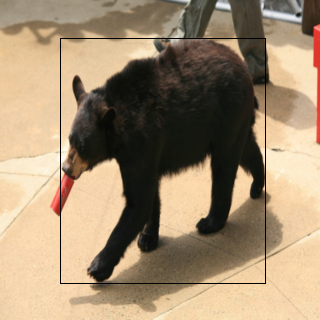

In [13]:
immm = torchvision.utils.draw_bounding_boxes((image*255).to(torch.uint8), target['boxes'])
img = torchvision.transforms.ToPILImage()(immm)
img

In [14]:
class CustomImageDataset(torch.utils.data.Dataset):
    def __init__(self, annotations_file, img_dir, labels_names, transform=None, target_transform=None):
        self.annotations = pd.read_csv(annotations_file, sep=" ")
        self.img_dir = img_dir
        self.transform = transform
        self.target_transform = target_transform

        self.__le = LabelEncoder()
        self.__le.fit(labels_names)

        self.scaler = ScaleJitter(target_size=(320,320))

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, idx):

        img_path = self.img_dir + self.annotations.iloc[idx, 0]  # os.path.join(self.img_dir, self.annotations.iloc[idx, 0])
        label_path = self.img_dir + self.annotations.iloc[idx, 1] # os.path.join(self.img_dir, self.annotations.iloc[idx, 1])
        # image = read_image(img_path)/255
        image = Image.open(img_path).convert("RGB")
        image = torchvision.transforms.ToTensor()(image).to(torch.float32)
        label = dict()
        labels = []
        boxes = []
        with open(label_path) as f:
            lines = [line.rstrip().split() for line in f]
            for line in lines:
                labels.append("_".join(line[0:-4]))
                boxes.append(torch.Tensor([float(line[-4]), float(line[-3]),
                                                float(line[-2]), float(line[-1])]))

        # num_objs = len(labels)
        boxes = torch.stack(boxes, 0)
        # iscrowd = torch.zeros((num_objs,), dtype=torch.int64)
        label["labels"] = torch.tensor(self.__le.transform(labels), dtype=torch.int64)
        label["boxes"] = boxes
        # label["image_id"] = idx
        # label["area"] = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        # label["iscrowd"] = iscrowd

        image, label = self.scaler(image, label)

        if self.transform:
            image = self.transform(image)
        if self.target_transform:
            label = self.target_transform(label)
        return image, label

Como tenemos los directorios con espacios los juntamos con "_" (un poco cutre, lo sabemos)

In [15]:
import os

In [16]:
# directories = []
training_dir="C:/Users/User/5GIA/VO/Proyecto final/animals_dataset_bbs/train"
test_dir="C:/Users/User/5GIA/VO/Proyecto final/animals_dataset_bbs/test"
# for directory in os.listdir(training_dir):
#     directories.append(directory)
# for name in directories:
#     if len(name.split(" ")) > 1:
#         train_name = os.path.join(training_dir, name)
#         test_name = os.path.join(test_dir, name)
#         os.rename(train_name, os.path.join(training_dir, "_".join(name.split(" "))))
#         os.rename(test_name, os.path.join(test_dir, "_".join(name.split(" "))))

In [17]:
directories = []
for directory in os.listdir(training_dir):
    directories.append(directory)
print(directories)

['Bear', 'Brown_bear', 'Bull', 'Butterfly', 'Camel', 'Canary', 'Caterpillar', 'Cattle', 'Centipede', 'Cheetah', 'Chicken', 'Crab', 'Crocodile', 'Deer', 'Duck', 'Eagle', 'Elephant', 'Fish', 'Fox', 'Frog', 'Giraffe', 'Goat', 'Goldfish', 'Goose', 'Hamster', 'Harbor_seal', 'Hedgehog', 'Hippopotamus', 'Horse', 'Jaguar', 'Jellyfish', 'Kangaroo', 'Koala', 'Ladybug', 'Leopard', 'Lion', 'Lizard', 'Lynx', 'Magpie', 'Monkey', 'Moths_and_butterflies', 'Mouse', 'Mule', 'Ostrich', 'Otter', 'Owl', 'Panda', 'Parrot', 'Penguin', 'Pig', 'Polar_bear', 'Rabbit', 'Raccoon', 'Raven', 'Red_panda', 'Rhinoceros', 'Scorpion', 'Seahorse', 'Sea_lion', 'Sea_turtle', 'Shark', 'Sheep', 'Shrimp', 'Snail', 'Snake', 'Sparrow', 'Spider', 'Squid', 'Squirrel', 'Starfish', 'Swan', 'Tick', 'Tiger', 'Tortoise', 'Turkey', 'Turtle', 'Whale', 'Woodpecker', 'Worm', 'Zebra']


In [18]:
# check if in photos of an animal there are other animals too

# for animal in directories:
#     for file in os.listdir(os.path.join(training_dir, animal, "Label")):
#         label_path = os.path.join(training_dir, animal, "Label", file)
#         with open(label_path) as f:
#             lines = [line.rstrip().split() for line in f]
#             lbl = "_".join(lines[0][0:-4])
#             for line in lines:
#                 if lbl != "_".join(line[0:-4]):
#                     print(lbl)
#                     print(line[0:-4])
#                     print()

# it seems that there are only the ones of the name of the folder :)

Creamos los datasets para cada split

In [19]:
# read Data and make a dataset
# /content/drive/MyDrive/Q5/VO/VO_Lab/Final_Project/EX1/annotations_train.txt
train = CustomImageDataset("C:/Users/User/5GIA/VO/Proyecto final/annotations_train.txt", "C:/Users/User/5GIA/VO/Proyecto final/animals_dataset_bbs", labels_names=directories, transform=None, target_transform=None)

In [20]:
# si no fem servir test
val = CustomImageDataset("C:/Users/User/5GIA/VO/Proyecto final/annotations_test.txt", "C:/Users/User/5GIA/VO/Proyecto final/animals_dataset_bbs", labels_names=directories, transform=None, target_transform=None)

In [21]:
# val = CustomImageDataset("C:/Users/User/5GIA/VO/Proyecto final/annotations_val.txt", "C:/Users/User/5GIA/VO/Proyecto final/animals_dataset_bbs", labels_names=directories, transform=None, target_transform=None)
# test = CustomImageDataset("C:/Users/User/5GIA/VO/Proyecto final/annotations_test.txt", "C:/Users/User/5GIA/VO/Proyecto final/animals_dataset_bbs", labels_names=directories, transform=None, target_transform=None)

Creamos un dataloader para cada split, como las imágenes no son del mismo tamaño tenemos que crear un collate_fn personalizado

In [22]:
# collate_fn to stack different size images into batch
def my_collate(batch):
    data = [item[0] for item in batch]
    target = [item[1] for item in batch]
    return data, target

Escogemos el batch size más grande que quepa en la gráfica (hacemos potencias de 2 porque somos alquimistas)

In [23]:
batch_size=128

In [24]:
# create a DataLoader for batches
from torch.utils.data import DataLoader

train_dataloader = DataLoader(train, batch_size=batch_size, shuffle=True, collate_fn=my_collate)
val_dataloader = DataLoader(val, batch_size=batch_size, shuffle=True, collate_fn=my_collate)
# test_dataloader = DataLoader(test, batch_size=batch_size, shuffle=True, collate_fn=my_collate)

Nos descargamos el modelo y unos pesos ya entrenados

In [25]:
# model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights="DEFAULT")
# trainable_backbone_layers default is set to 3
# MobileNet_V3_Large_Weights.IMAGENET1K_V1  /  COCO_V1
model = torchvision.models.detection.fasterrcnn_mobilenet_v3_large_320_fpn(weights="COCO_V1", trainable_backbone_layers=2)

In [26]:
num_classes=len(directories)
num_classes

80

In [27]:
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

In [28]:
# model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

In [29]:
# we need an optimizer to make loss go down
opt = torch.optim.Adam(model.parameters(), lr=0.0001, betas=(0.9, 0.999), eps=1e-08, weight_decay=1e-3)

In [30]:
# we need to specify which is our loss (criterion)
crit = None

In [31]:
# a scheduler to make lr lower every time
lr_scheduler = torch.optim.lr_scheduler.StepLR(opt, step_size=4, gamma=0.1)

In [32]:
model = model.to(device)

Usamos funciones auxiliares ya hechas para entrenar

In [33]:
# os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/engine.py")
# os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/utils.py")
# os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/coco_utils.py")
# os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/coco_eval.py")
# os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/transforms.py")

In [34]:
from engine import train_one_epoch  # , evaluate

Funciones para recolectar metricas durante el entrenamiento

In [35]:
@torch.inference_mode()
def check_val_loss(model, dataloader, device):
    d = {"loss":0,  "loss_classifier":0,  "loss_box_reg":0,  "loss_objectness":0,  "loss_rpn_box_reg":0}
    model.train()
    c=1
    for batch in dataloader:

        imgs = [b.to(device) for b in batch[0]]
        loss_dict = model(imgs, [{k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in t.items()} for t in batch[1]])
        losses = sum(loss for loss in loss_dict.values()).item()

        d["loss"]+=losses # calculate sum
        for i in loss_dict:
            d[i] += loss_dict[i].item()

        print(f'checking val batch {c}')
        c+=1

    for i in d:  # calculate avg
        d[i] /= (c-1)
    return d


In [36]:
from torchvision.ops import box_iou
# calculate average IoU (0 if labels are wrong) for each epoch
def calc_avg_iou(pred, target, d, device):

    for i in range(len(pred)):  #for each image

        true_lbl = target[i]["labels"][0].item()

        nms_idx = torchvision.ops.nms(pred[i]["boxes"], pred[i]["scores"], iou_threshold=0.5)

        pred[i]["boxes"] = pred[i]["boxes"][nms_idx]
        pred[i]["labels"] = pred[i]["labels"][nms_idx]
        pred[i]["scores"] = pred[i]["scores"][nms_idx]

        n = pred[i]["labels"].size()[0]
        # m = target[i]["labels"].size()[0]
        d["label_counter"] += n
        same_label_idx = [i for i, lbl in enumerate(pred[i]["labels"]) if lbl.item() == true_lbl]
        ############################################################################################################
        sum_iou = box_iou(pred[i]["boxes"], target[i]["boxes"].to(device))[same_label_idx].sum().item()  # calculate sum IoU for an image
        ############################################################################################################

        d['iou'] += sum_iou  # add mean

In [37]:
@torch.inference_mode()
def eval_model(model, dataloader, device, lbls):
    model.eval()
    d = {"iou":0, "label_counter":0}
    c = 1
    for batch in dataloader:
        outputs = model([b.to(device) for b in batch[0]])  # List[Dict[Tensor]] ; a dict for every image, dict has 3 keys: labels, boxes, scores

        calc_avg_iou(pred=outputs, target=batch[1], d=d, device=device)  # calculate iou for batch

        print(f'checking model inference, batch {c}')
        c+=1
    label_counter = d['label_counter'] if d['label_counter'] > 0 else 1
    d['iou'] /= label_counter # calculate avg iou
    return d

In [38]:
@torch.inference_mode
def calc_cm_metrics(model, dataloader, device):

    model.eval()

    d = {"true_label":[], "score":[], "predicted_label":[]}

    # d = {"TP":0, "FP":0, "FN":0, "TN":0}
    # all_metrics = []
    # cm_metrics = [copy.deepcopy([d.copy() for _ in range(80)]) for _ in range(11)]

    for batch in dataloader:
        pred = model([b.to(device) for b in batch[0]])
        target = batch[1]
        for i in range(len(pred)):  # for each image
            true_label = target[i]["labels"][0].item()


            nms_idx = torchvision.ops.nms(pred[i]["boxes"], pred[i]["scores"], iou_threshold=0.5)

            pred[i]["boxes"] = pred[i]["boxes"][nms_idx]
            pred[i]["labels"] = pred[i]["labels"][nms_idx]
            pred[i]["scores"] = pred[i]["scores"][nms_idx]

            n = pred[i]["labels"].size()[0]
            for j in range(n):  # for each predicted label
                predicted_label = pred[i]["labels"][j].item()
                score = pred[i]["scores"][j].item()
                d["true_label"].append(true_label)
                d["predicted_label"].append(predicted_label)
                d["score"].append(score)
    return d



Entrenamos el modelo

In [39]:
num_epochs=14

In [40]:
loggers = []
val_loss = []
metrics_train = []
metrics_val = []
for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    print(f"Training {epoch}")
    metriclogger = train_one_epoch(model, opt, train_dataloader, device, epoch, print_freq=1)
    loggers.append(metriclogger)

    print("Collecting val losses")
    val_loss_dict = check_val_loss(model, val_dataloader, device)
    val_loss.append(val_loss_dict)

    # update the learning rate
    lr_scheduler.step()

    # recolect results from train
    print("Recolecting metrics from train")
    metrics_train.append(eval_model(model, train_dataloader, device, directories))

    # recolect results from val
    print("Recolecting metrics from val")
    metrics_val.append(eval_model(model, val_dataloader, device, directories))

Training 0


Epoch: [0]  [  0/177]  eta: 0:14:31  lr: 0.000001  loss: 5.4671 (5.4671)  loss_classifier: 4.4781 (4.4781)  loss_box_reg: 0.9550 (0.9550)  loss_objectness: 0.0263 (0.0263)  loss_rpn_box_reg: 0.0077 (0.0077)  time: 4.9230  data: 2.6296  max mem: 2977
Epoch: [0]  [  1/177]  eta: 0:13:22  lr: 0.000001  loss: 5.4671 (5.4965)  loss_classifier: 4.4024 (4.4403)  loss_box_reg: 0.9550 (1.0251)  loss_objectness: 0.0240 (0.0251)  loss_rpn_box_reg: 0.0043 (0.0060)  time: 4.5595  data: 2.8755  max mem: 3207
Epoch: [0]  [  2/177]  eta: 0:12:35  lr: 0.000002  loss: 5.4937 (5.4956)  loss_classifier: 4.4267 (4.4358)  loss_box_reg: 1.0484 (1.0328)  loss_objectness: 0.0240 (0.0220)  loss_rpn_box_reg: 0.0043 (0.0050)  time: 4.3165  data: 2.8892  max mem: 3208
Epoch: [0]  [  3/177]  eta: 0:12:01  lr: 0.000002  loss: 5.4671 (5.4731)  loss_classifier: 4.4024 (4.4246)  loss_box_reg: 0.9914 (1.0225)  loss_objectness: 0.0195 (0.0214)  loss_rpn_box_reg: 0.0037 (0.0047)  time: 4.1466  data: 2.8159  max mem: 3209


In [41]:
cm_metrics_val = calc_cm_metrics(model, val_dataloader, device)

In [42]:
# recolect results from test
# test_metric_dict = eval_model(model, test_dataloader, device, directories)

In [43]:
# print results
save_path = r"C:\Users\User\5GIA\VO\Proyecto final\grafics"

Funciones para hacer plots de curvas

In [44]:
# !pip install -q torchmetrics

In [45]:
# from torchmetrics import PrecisionRecallCurve, ROC
from torchmetrics.classification import MulticlassPrecisionRecallCurve, MulticlassROC

In [46]:
def preproces_curve(d):
    target = torch.tensor(d["true_label"])
    pred = []
    n_predictions = len(d["true_label"])
    for i in range(n_predictions):
        score = d["score"][i]
        pred_label = d["predicted_label"][i]
        others_prob = (1-score)/79
        temp_pred = [others_prob if i!=pred_label else score for i in range(80)]
        pred.append(temp_pred)
    pred = torch.tensor(pred)


    return pred, target

In [47]:
def plot_rcnn_loss(loggers, losses_val, str_loss):
    # loss  loss_classifier  loss_box_reg  loss_objectness  loss_rpn_box_reg
    fig = plt.figure()
    ax = fig.add_subplot(111)
    y = [logger.meters[str_loss].avg for logger in loggers]
    x = [i for i in range(1, len(y)+1)]
    y_val = [v[str_loss] for v in losses_val]
    ax.plot(x, y, color='blue', label="train")
    ax.plot(x, y_val, color='red', label="val")
    ax.set_xlabel('Epoch')
    ax.set_ylabel(str_loss)
    ax.legend(loc='best')
    plt.show()
    # plt.savefig(os.path.join(save_path, f"{str_loss}_curve"))


In [48]:
def plot_iou_curve(lst, curve_name):
    # plot IoU P R RFP curves
    fig = plt.figure()
    ax = fig.add_subplot(111)
    iou = [d["iou"] for d in lst]
    x = [i for i in range(1, len(iou)+1)]


    ax.plot(x, iou, color='blue', label="IoU")

    ax.set_xlabel('Epoch')
    ax.legend(loc='best')
    plt.show()



In [49]:
def plot_PR(pred, target, th=None, curve_name="PR"):

    if type(th) == list:
        n = len(th)

    elif type(th) == int:
        n = th
    
    else:
        th = 101

    mcprc = MulticlassPrecisionRecallCurve(num_classes=80, thresholds=th)
    Ps, Rs, thresholds = mcprc(pred, target)
    print(f"thresholds used: {thresholds}")
    
    P = [0 for _ in range(n)]
    R = [0 for _ in range(n)]
    for a in range(80):
        for i in range(n):
            P[i] += Ps[a][i].item()
            R[i] += Rs[a][i].item()

    for i in range(n):
        P[i] /= 80
        R[i] /= 80

    P[-1]=1
    R[-1]=0

    # print(P,R)




    fig = plt.figure()
    ax = fig.add_subplot(111)
    ax.plot(R, P, label=curve_name)

    ax.set_xlabel('Sensibilidad')
    ax.set_ylabel("Precisión")
    ax.legend(loc='best')
    plt.show()
    # plt.savefig(os.path.join(save_path, curve_name))

In [50]:
def plot_ROC(pred, target, th=None, curve_name="ROC_curve"):
    
    if type(th) == list:
        n = len(th)

    elif type(th) == int:
        n = th
    
    else:
        th = 101

    roc = MulticlassROC(num_classes=80, thresholds=th)
    fprs, tprs, thresholds = roc(pred, target)
    print(f"thresholds used: {thresholds}")

    RFP = [0 for _ in range(n)]
    R = [0 for _ in range(n)]
    for a in range(80):
        for i in range(n):
            RFP[i] += fprs[a][i].item()
            R[i] += tprs[a][i].item()
    for i in range(n):
        RFP[i] /= 80
        R[i] /= 80

    # RFP.append(1)
    # R.append(1)
    # print(RFP)
    # print(R)

    fig = plt.figure()
    ax = fig.add_subplot(111)

    ax.plot(RFP, R, label=curve_name)

    ax.set_xlabel('Ratio Falsos Positivos')
    ax.set_ylabel("Sensibilidad")
    ax.legend(loc='best')
    plt.show()
    # plt.savefig(os.path.join(save_path, curve_name))

Ploteamos las curvas de loss para ver si hay overfit

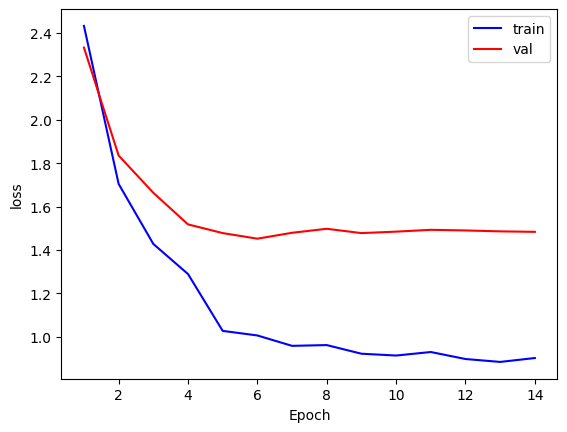

In [51]:
plot_rcnn_loss(loggers, val_loss, "loss")

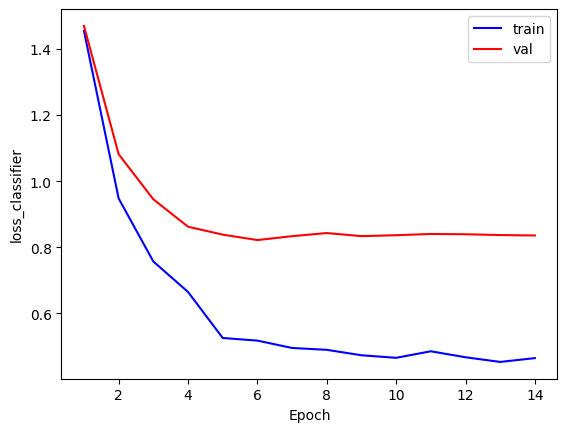

In [52]:
plot_rcnn_loss(loggers, val_loss, "loss_classifier")

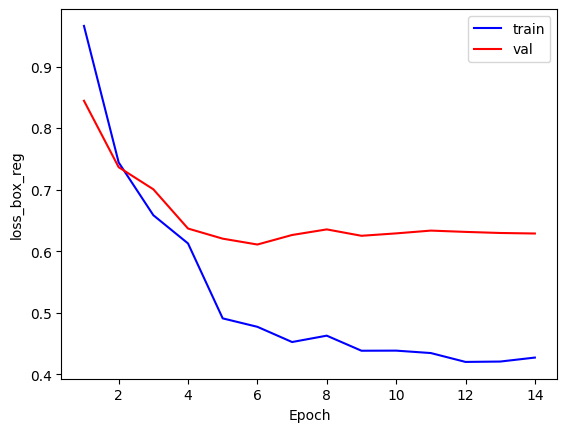

In [53]:
plot_rcnn_loss(loggers, val_loss, "loss_box_reg")

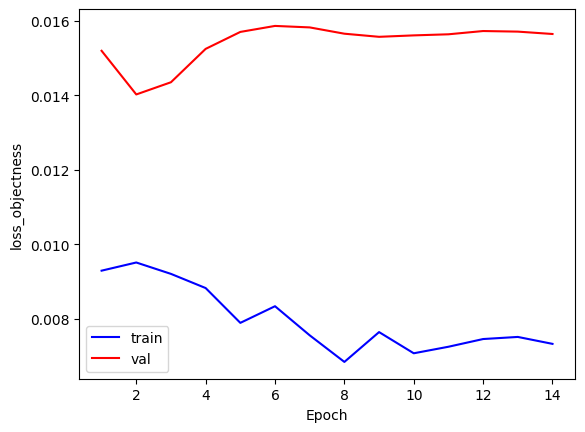

In [54]:
plot_rcnn_loss(loggers, val_loss, "loss_objectness")

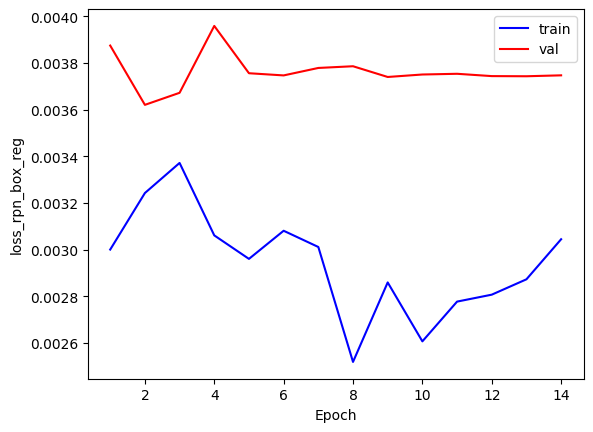

In [55]:
plot_rcnn_loss(loggers, val_loss, "loss_rpn_box_reg")

Mostramos como ha cambiado IoU, Recall, Precision y RFP durante el entrenamiento

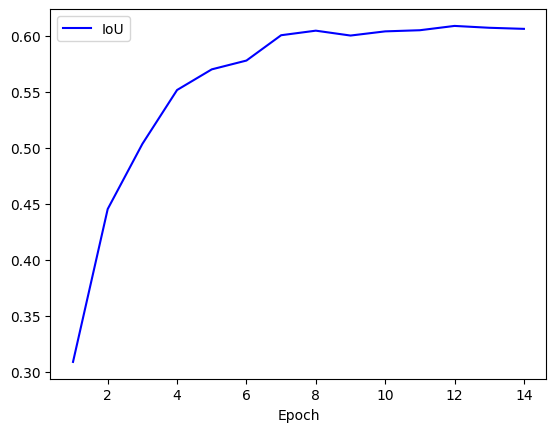

In [56]:
plot_iou_curve(metrics_train, "train_iou")

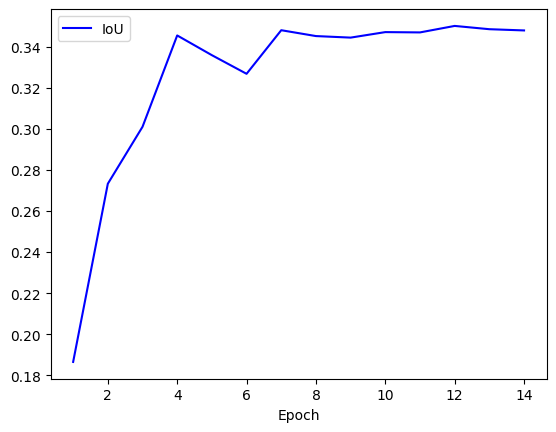

In [57]:
plot_iou_curve(metrics_val, "val_iou")

In [58]:
metrics_val[-1]

{'iou': 0.3478659388439072, 'label_counter': 11773}

Mostramos las curvas PR y ROC

In [59]:
ttt = [0., 0.1,0.2,0.3,0.4,0.5,0.6,0.7, 0.9,1.]

In [60]:
pred_val, target_val = preproces_curve(cm_metrics_val)

thresholds used: tensor([0.0000, 0.1000, 0.2000, 0.3000, 0.4000, 0.5000, 0.6000, 0.7000, 0.9000,
        1.0000])


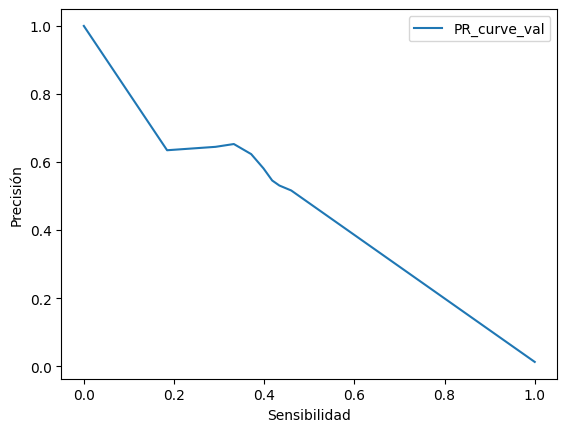

In [61]:
plot_PR(pred_val, target_val, ttt, "PR_curve_val")

In [62]:
ttt2 = [0., 0.1,0.2,0.3,0.4,0.5,0.6,0.7, 0.9,1.]

thresholds used: tensor([1.0000, 0.9000, 0.7000, 0.6000, 0.5000, 0.4000, 0.3000, 0.2000, 0.1000,
        0.0000])


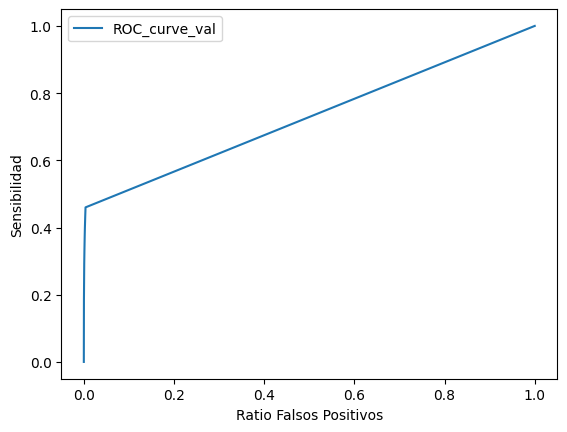

In [63]:
plot_ROC(pred_val, target_val,ttt, "ROC_curve_val")

Mostrar los resultados que hemos obtenido en los datos de test (no usados para nada durante el entrenamiento)

In [64]:
# test_metric_dict

In [65]:
# hacer ROC, PR para test

In [66]:
# cm_metrics_test = calc_cm_metrics(model, test_dataloader, device)

In [67]:
# pred_test, target_test = preproces_curve(cm_metrics_test)

In [68]:
# plot_PR(pred_test, target_test, "PR_curve_test")

In [69]:
# plot_ROC(pred_test, target_test, "ROC_curve_test")

Guardamos los pesos del modelo para si en un futuro lo queremos volver a usar

In [70]:
PATH = os.path.join(save_path, "model_weights.pth")
torch.save(model.state_dict(), PATH)

Ahora recuperamos el modelo y hacemos inferencia en algunos ejemplos para ver que saca

In [71]:
model = torchvision.models.detection.fasterrcnn_mobilenet_v3_large_320_fpn()

in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

model.load_state_dict(torch.load(PATH))
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(320,), max_size=640, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): FrozenBatchNorm2d(16, eps=1e-05)
        (2): Hardswish()
      )
      (1): InvertedResidual(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
            (1): FrozenBatchNorm2d(16, eps=1e-05)
            (2): ReLU(inplace=True)
          )
          (1): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d(16, eps=1e-05)
          )
        )
      )
      (2): InvertedResidual(
        (block): 

In [72]:
from random import sample

In [73]:
animals = sample(directories, 3)

In [74]:
paths = []
for animal in animals:
    path = os.path.join(test_dir, animal)
    pos_imgs = os.listdir(path)
    a = sample(pos_imgs, 1)[0]
    while a == "Label":
        a = sample(pos_imgs, 1)[0]
    path = os.path.join(path, a)

    paths.append(path)
print(paths)

['C:/Users/User/5GIA/VO/Proyecto final/animals_dataset_bbs/test\\Frog\\36fe92e9ea45cf4f.jpg', 'C:/Users/User/5GIA/VO/Proyecto final/animals_dataset_bbs/test\\Worm\\3e7444dcd0dd3a6a.jpg', 'C:/Users/User/5GIA/VO/Proyecto final/animals_dataset_bbs/test\\Sea_lion\\96be6cd1f1c91170.jpg']


In [75]:
images = []
for p in paths:
    image = Image.open(p).convert("RGB")
    image = torchvision.transforms.ToTensor()(image).to(torch.float32)
    images.append(image)

In [76]:
pred = model(images)

In [77]:
for i in range(len(pred)):
    nms_idx = torchvision.ops.nms(pred[i]["boxes"], pred[i]["scores"], iou_threshold=0.5)

    pred[i]["boxes"] = pred[i]["boxes"][nms_idx]
    pred[i]["labels"] = pred[i]["labels"][nms_idx]
    pred[i]["scores"] = pred[i]["scores"][nms_idx]

In [78]:
pred

[{'boxes': tensor([[ 53.1533, 175.0990, 884.8725, 621.5630]], grad_fn=<IndexBackward0>),
  'labels': tensor([19]),
  'scores': tensor([0.9118], grad_fn=<IndexBackward0>)},
 {'boxes': tensor([[328.5146,  76.3925, 711.7566, 570.5130],
          [342.4916, 277.1188, 442.4407, 500.5662],
          [ 83.2646, 121.5134, 732.2465, 663.4830]], grad_fn=<IndexBackward0>),
  'labels': tensor([78, 19, 78]),
  'scores': tensor([0.9071, 0.1142, 0.0597], grad_fn=<IndexBackward0>)},
 {'boxes': tensor([[  0.0000,   5.3127, 676.8757, 556.0959],
          [369.7014,  43.8132, 819.1496, 519.3373]], grad_fn=<IndexBackward0>),
  'labels': tensor([25, 25]),
  'scores': tensor([0.5256, 0.4582], grad_fn=<IndexBackward0>)}]

In [79]:
le = LabelEncoder()
le.fit(directories)


LabelEncoder()

In [80]:
bb_images = []
lbls = []
for i, output in enumerate(pred):
    immm = torchvision.utils.draw_bounding_boxes((images[i]*255).to(torch.uint8), output['boxes'], width=5)
    img = torchvision.transforms.ToPILImage()(immm)
    bb_images.append(img)
    lbls.append(le.inverse_transform(list(output['labels'])))

['Frog']


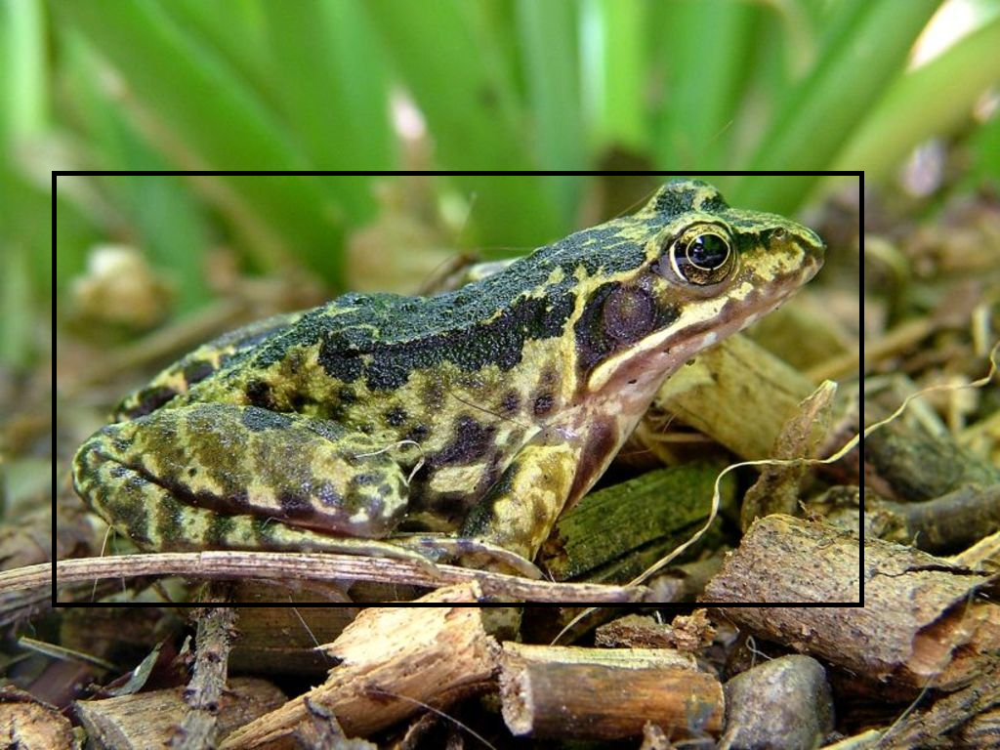

In [81]:
print(lbls[0])
bb_images[0]

['Worm' 'Frog' 'Worm']


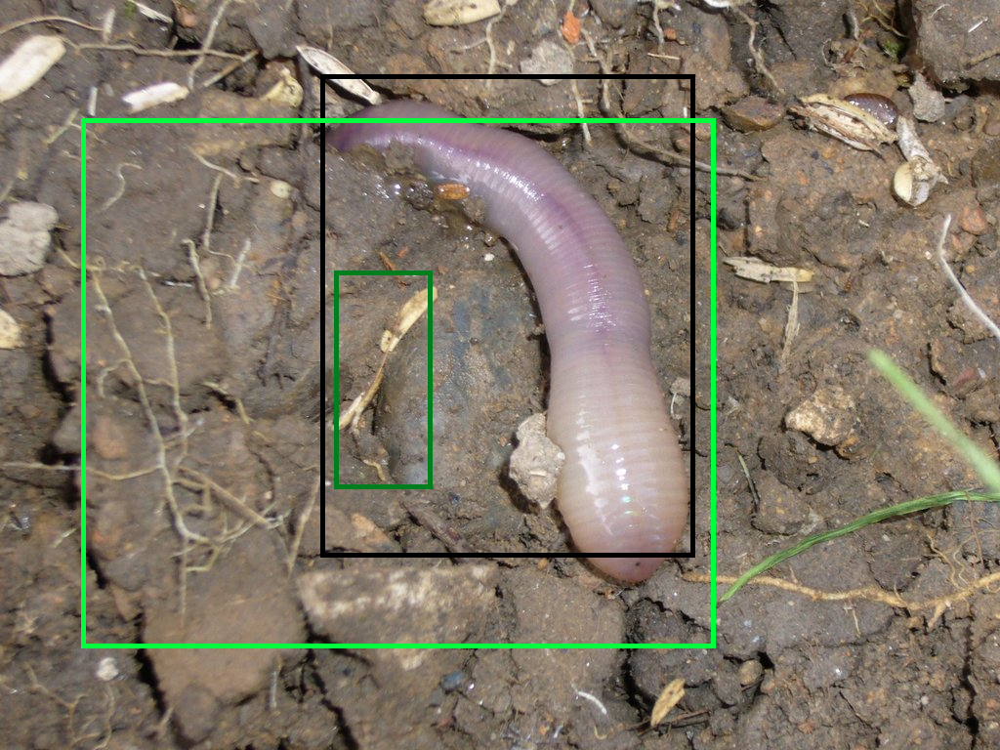

In [82]:
print(lbls[1])
bb_images[1]

['Harbor_seal' 'Harbor_seal']


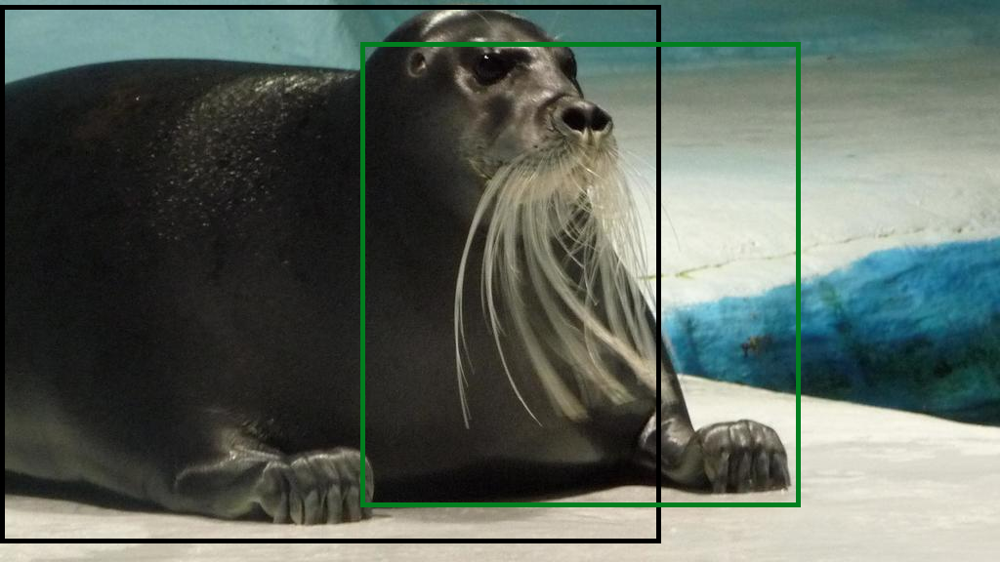

In [83]:
print(lbls[2])
bb_images[2]

Ahora probamos con una foto nuestra

In [84]:

Tula = Image.open(r"C:\Users\User\5GIA\VO\Proyecto final\foto_Tula_VO.jpg").convert("RGB")
Tula = torchvision.transforms.ToTensor()(Tula).to(torch.float32)

In [85]:
pred = model([Tula])
nms_idx = torchvision.ops.nms(pred[0]["boxes"], pred[0]["scores"], iou_threshold=0.5)

pred[0]["boxes"] = pred[0]["boxes"][nms_idx]
pred[0]["labels"] = pred[0]["labels"][nms_idx]
pred[0]["scores"] = pred[0]["scores"][nms_idx]

In [86]:
immm = torchvision.utils.draw_bounding_boxes((Tula*255).to(torch.uint8), pred[0]['boxes'], width=5)
img = torchvision.transforms.ToPILImage()(immm)
img
lbl = le.inverse_transform(list(pred[0]['labels']))

['Tortoise']


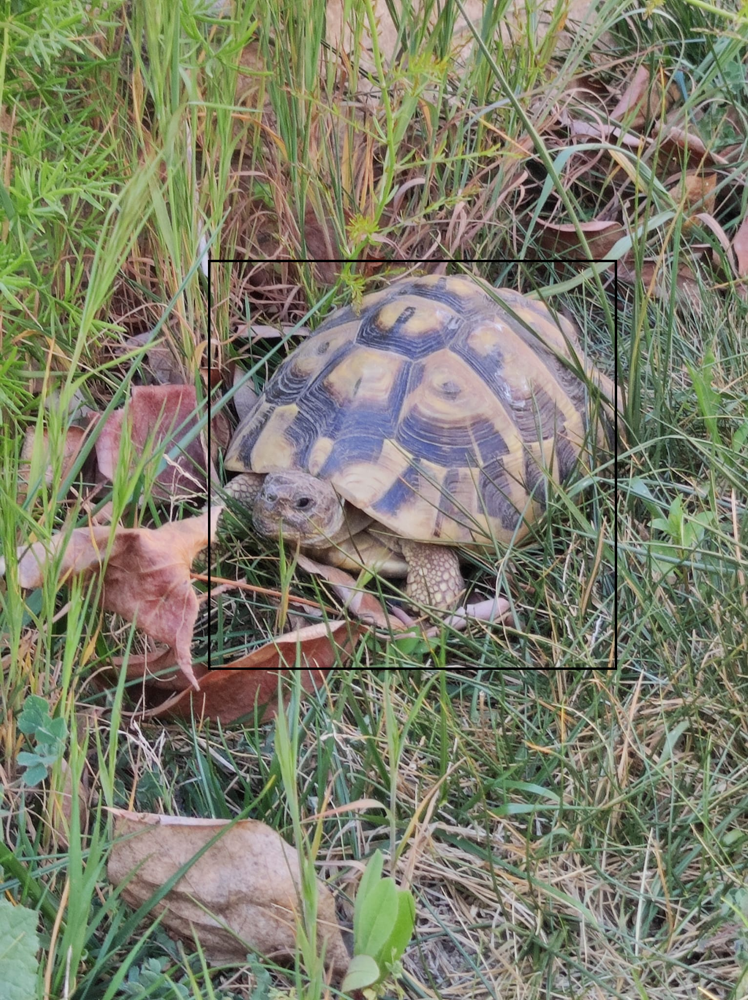

In [87]:
print(lbl)
img

Se acabó el notebook